In [3]:
import librosa
import librosa.display 
import IPython.display as ipd
import numpy as np
import matplotlib.pyplot as plt

In [4]:
solo_file = 'audio/solonorman.wav'

In [5]:
ipd.Audio(solo_file)

In [6]:
#load file audio librosa
solo, sr = librosa.load(solo_file)

# extract audio with short-time fourier transform

In [7]:
FRAME_SIZE = 2048
HOP_SIZE = 512

In [8]:
S_solo = librosa.stft(solo, n_fft=FRAME_SIZE, hop_length=HOP_SIZE)

In [9]:
S_solo.shape #(framesize/2+1,n of frame temporal bins) 

(1025, 1790)

In [10]:
type(S_solo[0][0])

numpy.complex64

# calculate complex number to spectrogram

In [11]:
calc_spec = np.abs(S_solo) ** 2 #magnitude = absolute num squared 

In [12]:
calc_spec.shape

(1025, 1790)

In [13]:
type(calc_spec[0][0])

numpy.float32

# plot float to spectrogram

In [14]:
def plot_spectrogram(spec, sr, hop_length, y_axis='linear'):
    plt.figure(figsize=(25,10))
    librosa.display.specshow(spec, sr=sr, hop_length=hop_length, x_axis='time', y_axis=y_axis)
    plt.colorbar(format="%+2.f")

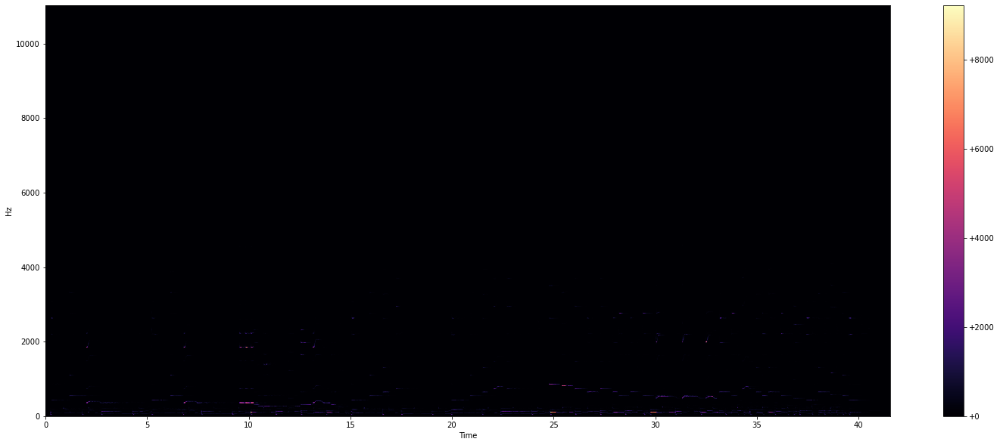

In [15]:
plot_spectrogram(calc_spec, sr, HOP_SIZE)

# convert linear amplitude to log-amplitude 

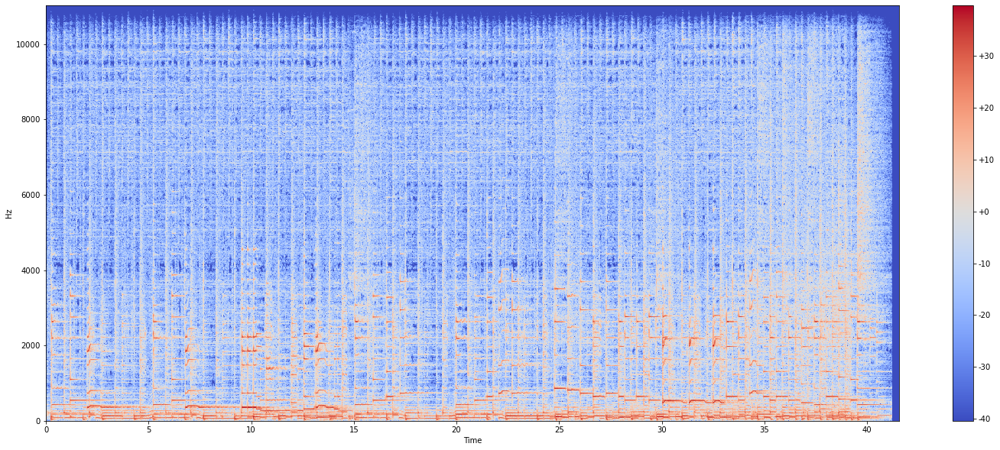

In [16]:
log_amp = librosa.power_to_db(calc_spec)
plot_spectrogram(log_amp, sr, HOP_SIZE)

# log-frequency spectrogram

C:\ProgramData\Anaconda3\lib\site-packages\librosa\display.py:974: MatplotlibDeprecationWarning: The 'basey' parameter of __init__() has been renamed 'base' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  scaler(mode, **kwargs)
C:\ProgramData\Anaconda3\lib\site-packages\librosa\display.py:974: MatplotlibDeprecationWarning: The 'linthreshy' parameter of __init__() has been renamed 'linthresh' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  scaler(mode, **kwargs)
C:\ProgramData\Anaconda3\lib\site-packages\librosa\display.py:974: MatplotlibDeprecationWarning: The 'linscaley' parameter of __init__() has been renamed 'linscale' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  scaler(mode, **kwargs)


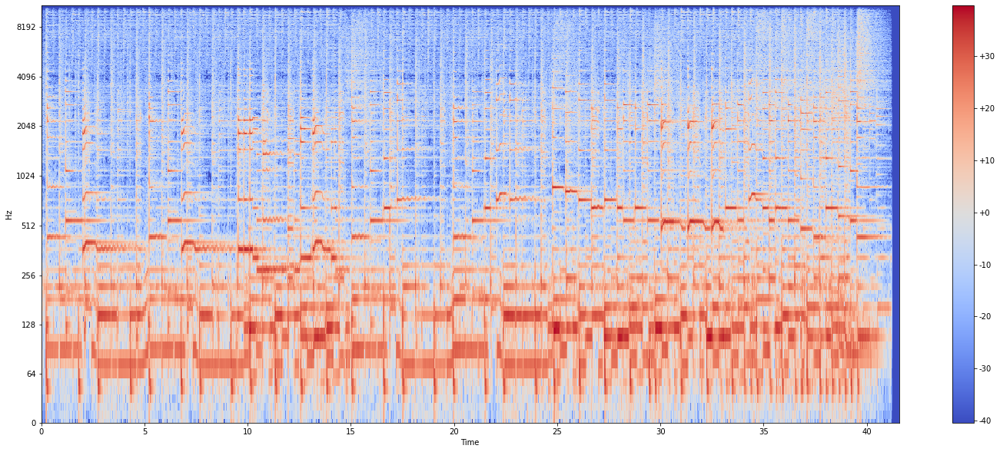

In [18]:
plot_spectrogram(log_amp, sr, HOP_SIZE, y_axis='log')